- Null-text Inversion implementation (official): [https://github.com/google/prompt-to-prompt/blob/main/null_text_w_ptp.ipynb](https://github.com/google/prompt-to-prompt/blob/main/null_text_w_ptp.ipynb)
- Imagic implementation (unofficial): [https://github.com/justinpinkney/stable-diffusion/blob/main/notebooks/imagic.ipynb](https://github.com/justinpinkney/stable-diffusion/blob/main/notebooks/imagic.ipynb)
- Diffusers Community Pipeline, Imagic: [https://github.com/MarkRich/diffusers/blob/8d1d60c4c2554c355f856ef330fb7b7f00f329b9/examples/community/imagic_stable_diffusion.py](https://github.com/MarkRich/diffusers/blob/8d1d60c4c2554c355f856ef330fb7b7f00f329b9/examples/community/imagic_stable_diffusion.py) 
[https://github.com/huggingface/diffusers/issues/895](https://github.com/huggingface/diffusers/issues/895)

 # Requirements, imports and loads

In [ ]:
!pip install xformers

In [ ]:
!pip install diffusers==0.8.1

In [ ]:
!pip install transformers

In [ ]:
!pip install accelerate

In [ ]:
!wget https://raw.githubusercontent.com/google/prompt-to-prompt/main/seq_aligner.py -O seq_aligner.py
!wget https://raw.githubusercontent.com/google/prompt-to-prompt/main/ptp_utils.py -O ptp_utils.py

In [ ]:
!gdown --fuzzy "https://drive.google.com/file/d/1r-eToqw2g9kRI7Ohj25DgHuPwXGL20CZ/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1Uu1RkeyJfBnnyi9DNLxzCPFNOqfD-7VO/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1jGtvZn7hKgU7VmcEzkh5JfLqukup5hSH/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1LLNJ4hC4z3BPR0NV5qM28tiHAyRNPZk1/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1nWhF-KQYNfxnNx7zPC7PJmZSHatMA0aX/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1S2067l5_sgNqY5r7GGWtUt4PRGmo1TSn/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/11QOUgiSXAzsOKgrGQqTrYrYTq4a-7p_6/view?usp=share_link"
!gdown --fuzzy "https://drive.google.com/file/d/1IieqtKKazHWeRgXKLw8U0-8PPeaT8xMX/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/14YyAwDyJshY4VT1fa8nUVRmDvQ26sZ8V/view?usp=sharing"
!wget 'https://www.dropbox.com/s/6tlwzr73jd1r9yk/obama.png?dl=1'

In [ ]:
!cat obama.png?dl\=1 > obama.png

In [ ]:
!gdown --fuzzy "https://drive.google.com/file/d/1Gu76sgVh_v_-C3165ZM333-QIgg1J_oE/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1FPhPtUReFpcAfatA-2avd6vGt0_lSKrM/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1E3Zc74AyKiIEZkzR_U6TGraB2YwaQMh0/view?usp=sharing"
!gdown --fuzzy "https://drive.google.com/file/d/1A4w9Dw-dRO8t198d0bGg5lkkt9WDt8m7/view?usp=sharing"

In [ ]:
from typing import Optional, Union, Tuple, List, Callable, Dict
from tqdm.notebook import tqdm
import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler
import torch.nn.functional as nnf
import numpy as np
import abc
import ptp_utils
import seq_aligner
import shutil
from torch.optim.adam import Adam
from PIL import Image

# Imagic

In [ ]:
scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)
LOW_RESOURCE = False 
NUM_DDIM_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
ldm_stable = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", scheduler=scheduler).to(device)
try:
    ldm_stable.disable_xformers_memory_efficient_attention()
except AttributeError:
    print("Attribute disable_xformers_memory_efficient_attention() is missing")
tokenizer = ldm_stable.tokenizer

## Infernce Code

In [ ]:
def load_512(image_path, left=0, right=0, top=0, bottom=0):
    if type(image_path) is str:
        image = np.array(Image.open(image_path))[:, :, :3]
    else:
        image = image_path
    h, w, c = image.shape
    left = min(left, w-1)
    right = min(right, w - left - 1)
    top = min(top, h - left - 1)
    bottom = min(bottom, h - top - 1)
    image = image[top:h-bottom, left:w-right]
    h, w, c = image.shape
    if h < w:
        offset = (w - h) // 2
        image = image[:, offset:offset + h]
    elif w < h:
        offset = (h - w) // 2
        image = image[offset:offset + w]
    image = np.array(Image.fromarray(image).resize((512, 512)))
    return image

In [ ]:
@torch.no_grad()
def diffusion_step(model, latents, context, t, guidance_scale, low_resource=False):
    if low_resource:
        noise_pred_uncond = model.unet(latents, t, encoder_hidden_states=context[0])["sample"]
        noise_prediction_text = model.unet(latents, t, encoder_hidden_states=context[1])["sample"]
    else:
        latents_input = torch.cat([latents] * 2)
        noise_pred = model.unet(latents_input, t, encoder_hidden_states=context)["sample"]
        noise_pred_uncond, noise_prediction_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_prediction_text - noise_pred_uncond)
    latents = model.scheduler.step(noise_pred, t, latents)["prev_sample"]
    return latents

@torch.no_grad()
def text2image_simple(
    model,
    text_embeddings,
    max_length,
    num_inference_steps: int = 50,
    guidance_scale: Optional[float] = 7.5,
    generator: Optional[torch.Generator] = None,
    latent: Optional[torch.FloatTensor] = None,
    uncond_embeddings=None,
    start_time=50,
    return_type='image'
):
    batch_size = 1
    height = width = 512
    
    if uncond_embeddings is None:
        uncond_input = model.tokenizer(
            [""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt"
        )
        uncond_embeddings_ = model.text_encoder(uncond_input.input_ids.to(model.device))[0]
    else:
        uncond_embeddings_ = None

    latent, latents = ptp_utils.init_latent(latent, model, height, width, generator, batch_size)
    model.scheduler.set_timesteps(num_inference_steps)
    for i, t in enumerate(tqdm(model.scheduler.timesteps[-start_time:])):
        if uncond_embeddings_ is None:
            context = torch.cat([uncond_embeddings[i].expand(*text_embeddings.shape), text_embeddings])
        else:
            context = torch.cat([uncond_embeddings_, text_embeddings])
        latents = diffusion_step(model, latents, context, t, guidance_scale, low_resource=False)
        
    if return_type == 'image':
        image = ptp_utils.latent2image(model.vae, latents)
    else:
        image = latents
    return image, latent

## Explore Imagic

In [ ]:
input_image = "./gnochi_mirror.jpeg"
prompt = "a photo of a tiger sitting next to a mirror"

text_input = ldm_stable.tokenizer(
    prompt,
    padding="max_length",
    max_length=ldm_stable.tokenizer.model_max_length,
    truncation=True,
    return_tensors="pt",
)
max_length = text_input.input_ids.shape[-1]
orig_emb = ldm_stable.text_encoder(text_input.input_ids.to(ldm_stable.device))[0]

emb = orig_emb.clone()

latents_dtype = emb.dtype

init_image = torch.from_numpy(load_512(input_image)).float() / 127.5 - 1
init_image = init_image.permute(2, 0, 1).unsqueeze(0).to(device=ldm_stable.device, dtype=latents_dtype)
init_image_latents = ldm_stable.vae.encode(init_image)['latent_dist'].mean
init_image_latents = 0.18215 * init_image_latents

start_code = torch.randn_like(init_image_latents)

  0%|          | 0/50 [00:00<?, ?it/s]

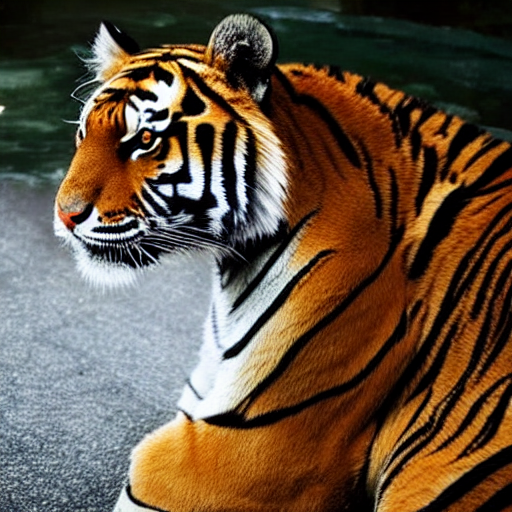

In [ ]:
# Генерация до обучения эмбеддинга с новым промптом
image, _ = text2image_simple(ldm_stable, orig_emb, max_length, latent=start_code, guidance_scale=7.5)
ptp_utils.view_images(image)

In [ ]:
# Обучаем эмбеддинг

emb = orig_emb.clone()
emb = emb.detach()
emb.requires_grad_()

ldm_stable.vae.requires_grad_(False)
ldm_stable.unet.requires_grad_(False)
ldm_stable.text_encoder.requires_grad_(False)
ldm_stable.unet.eval()
ldm_stable.vae.eval()
ldm_stable.text_encoder.eval()

lr = 0.002
it = 500
height = width = 512
optimizer = torch.optim.Adam([emb], lr=lr)
criterion = torch.nn.MSELoss(reduction="none")
history = []

pbar = tqdm(range(it))
for i in pbar:
    noise = torch.randn(init_image_latents.shape).to(init_image_latents.device)
    timesteps = torch.randint(1000, (1,), device=init_image_latents.device)

    noisy_latents = ldm_stable.scheduler.add_noise(init_image_latents, noise, timesteps)

    noise_pred = ldm_stable.unet(noisy_latents, timesteps, emb).sample

    loss = criterion(noise_pred, noise).mean([1, 2, 3]).mean()
    loss.backward()
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())

    optimizer.step()
    optimizer.zero_grad()

  0%|          | 0/500 [00:00<?, ?it/s]

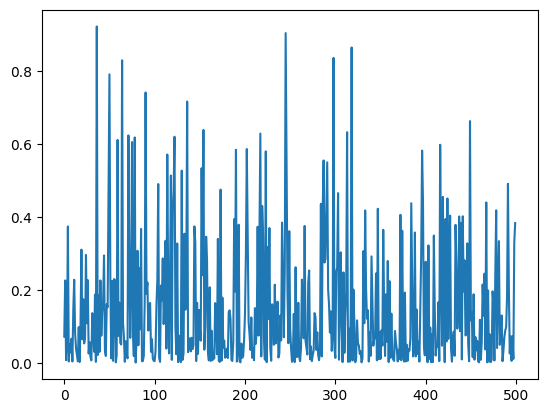

  0%|          | 0/50 [00:00<?, ?it/s]

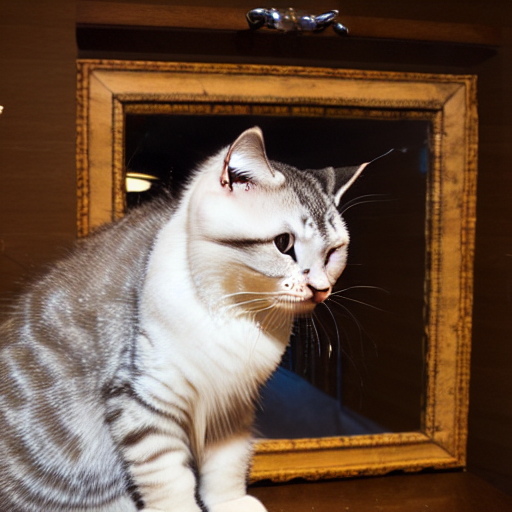

In [ ]:
# После обучения с новым промптом
import matplotlib.pyplot as plt
plt.plot(history)
plt.show()

image, _ = text2image_simple(ldm_stable, emb, max_length, latent=start_code, guidance_scale=7.5)
ptp_utils.view_images(image)

In [ ]:
# Дообучаем модель

emb.requires_grad = False
ldm_stable.unet.requires_grad_()
ldm_stable.unet.train()

lr = 5e-7
it = 1500
opt = torch.optim.Adam(ldm_stable.unet.parameters(), lr=lr)
criteria = torch.nn.MSELoss()
history = []

pbar = tqdm(range(it))
for i in pbar:
    opt.zero_grad()

    noise = torch.randn(init_image_latents.shape).to(init_image_latents.device)
    timesteps = torch.randint(ldm_stable.scheduler.num_train_timesteps, (1,), device=init_image_latents.device)

    noisy_latents = ldm_stable.scheduler.add_noise(init_image_latents, noise, timesteps)

    noise_pred = ldm_stable.unet(noisy_latents, timesteps, emb).sample
    
    loss = criteria(noise_pred, noise)
    loss.backward()
    pbar.set_postfix({"loss": loss.item()})
    history.append(loss.item())
    opt.step()

  0%|          | 0/1500 [00:00<?, ?it/s]

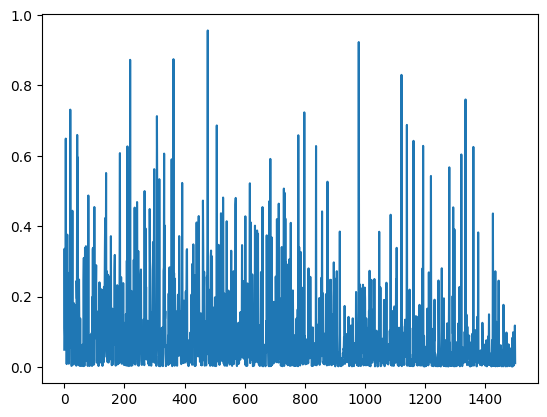

  0%|          | 0/50 [00:00<?, ?it/s]

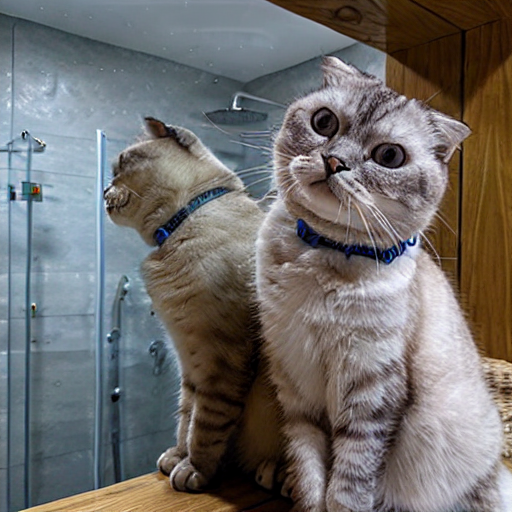

In [ ]:
# Результат генерации с обученным эмбеддингом и дообученной моделью
ldm_stable.unet.eval()
plt.plot(history)
plt.show()
image, _ = text2image_simple(ldm_stable, emb, max_length, latent=start_code, guidance_scale=7.5)
ptp_utils.view_images(image)

In [ ]:
# Генерируем с интерполяцией

from torchvision.utils import make_grid
from IPython.display import clear_output

alpha_range = (0, 0.1, 0.3, 0.5, 0.7, 0.9, 1)

grid = []
for alpha in tqdm(alpha_range):
    new_emb = alpha * orig_emb + (1-alpha) * emb
    image, _ = text2image_simple(ldm_stable, new_emb, max_length, latent=start_code)
    grid.append(torch.from_numpy(image).squeeze(0).permute(2, 0, 1))
clear_output()
grid = make_grid(grid, nrow=len(alpha_range))

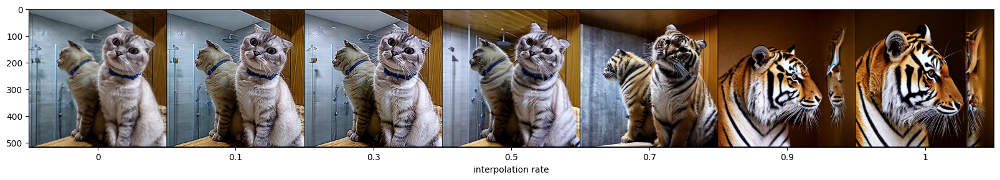

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
plt.imshow(grid.permute(1, 2, 0))

delta_x = (grid.shape[2] / len(alpha_range)) / 2
x_ticks = np.arange(len(alpha_range)) * delta_x * 2  + delta_x
plt.xticks(ticks=x_ticks, labels=alpha_range)
plt.xlabel('interpolation rate')

plt.show()

## Imagic code

In [ ]:
def learn_embedding(
    image_path, prompt, model, lr_emb=0.002, n_iters_emb=500, lr_model=5e-7, n_iters_model=1500
    ):
    """
    Parameters:
    image_path: str
        path to initial image
    prompt: str
        prompt describing the resukt of editing
    model: StableDiffusionPipeline
        pretrained stable diffusion model
    lr_emb: float
        learning rate for embedding optimization
    n_iters_emb: int
        number of optimization steps for embedding optimization
    lr_model: float
        learning rate for model finetuning
    n_iters_model: int
        number of optimization steps for model finetuning
    
    Returns: 
    torch.Tensor
        learned embedding (e_opt)
    torch.Tensor
        target embedding (e_tgt)
    int
        length of tokenized prompt
    StableDiffusionPipeline
        finetuned model
    """
    # Get an original embedding, corresponding to the editing prompt (e_tgt)
    text_input = model.tokenizer(
        prompt,
        padding="max_length",
        max_length=model.tokenizer.model_max_length,
        truncation=True,
        return_tensors="pt",
    )
    max_length = text_input.input_ids.shape[-1]
    orig_emb = model.text_encoder(text_input.input_ids.to(model.device))[0]

    # Learn an embedding, corresponding to the initial image (e_opt)
    emb = orig_emb.clone()
    emb = emb.detach()
    emb.requires_grad_()

    model.vae.requires_grad_(False)
    model.unet.requires_grad_(False)
    model.text_encoder.requires_grad_(False)
    model.unet.eval()
    model.vae.eval()
    model.text_encoder.eval()

    optimizer = torch.optim.Adam([emb], lr=lr_emb)
    criterion = torch.nn.MSELoss(reduction="none")

    image = torch.from_numpy(load_512(image_path)).float() / 127.5 - 1
    image = image.permute(2, 0, 1).unsqueeze(0).to(device=model.device, dtype=emb.dtype)
    latents = model.vae.encode(image)['latent_dist'].mean
    latents = latents * 0.18215

    print('Learning an embedding...')
    pbar = tqdm(range(n_iters_emb))
    for i in pbar:
        noise = torch.randn(latents.shape).to(latents.device)
        timesteps = torch.randint(1000, (1,), device=latents.device)

        noisy_latents = model.scheduler.add_noise(latents, noise, timesteps)
        noise_pred = model.unet(noisy_latents, timesteps, emb).sample

        loss = criterion(noise_pred, noise).mean([1, 2, 3]).mean()
        loss.backward()
        pbar.set_postfix({"loss": loss.item()})
        optimizer.step()
        optimizer.zero_grad()
    
    # Finetune the Diffusion Model
    emb.requires_grad = False
    model.unet.requires_grad_()
    model.unet.train()

    opt = torch.optim.Adam(model.unet.parameters(), lr=lr_model)
    criteria = torch.nn.MSELoss()
    history = []

    pbar = tqdm(range(n_iters_model))
    for i in pbar:
        opt.zero_grad()

        noise = torch.randn(latents.shape).to(latents.device)
        timesteps = torch.randint(model.scheduler.num_train_timesteps, (1,), device=latents.device)

        noisy_latents = model.scheduler.add_noise(latents, noise, timesteps)

        noise_pred = model.unet(noisy_latents, timesteps, emb).sample
        
        loss = criteria(noise_pred, noise)
        loss.backward()
        pbar.set_postfix({"loss": loss.item()})
        history.append(loss.item())
        opt.step()
    
    model.unet.eval()

    return emb, orig_emb, max_length, model

In [ ]:
from torchvision.utils import make_grid
from IPython.display import clear_output
import matplotlib.pyplot as plt

def generate_with_interpolation(
    init_emb, learned_emb, max_length, model,
    alpha_range = (0, 0.2, 0.4, 0.6, 0.8, 1), figsize=(20, 7)
):
    grid = []
    for alpha in tqdm(alpha_range):
        new_emb = alpha * init_emb + (1-alpha) * learned_emb
        image, _ = text2image_simple(model, new_emb, max_length)
        grid.append(torch.from_numpy(image).squeeze(0).permute(2, 0, 1))
    clear_output()
    grid = make_grid(grid, nrow=len(alpha_range))

    plt.figure(figsize=figsize)
    plt.imshow(grid.permute(1, 2, 0))

    delta_x = (grid.shape[2] / len(alpha_range)) / 2
    x_ticks = np.arange(len(alpha_range)) * delta_x * 2  + delta_x
    plt.xticks(ticks=x_ticks, labels=alpha_range)
    plt.xlabel('interpolation rate')

    plt.show()

    return grid

In [ ]:
from IPython.display import clear_output

LOW_RESOURCE = False 
NUM_DDIM_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77

def reload_model():
    scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)
    device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
    ldm_stable = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", scheduler=scheduler).to(device)
    try:
        ldm_stable.disable_xformers_memory_efficient_attention()
    except AttributeError:
        print("Attribute disable_xformers_memory_efficient_attention() is missing")
    clear_output()
    
    return ldm_stable

## Examples

### A picture of a cat

In [ ]:
image_path = "./gnochi_mirror.jpeg"
prompt = "a silver sculpture of a cat sitting next to a mirror"
model = reload_model()

emb, orig_emb, max_length, model = learn_embedding(image_path, prompt, model)

Learning an embedding...


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

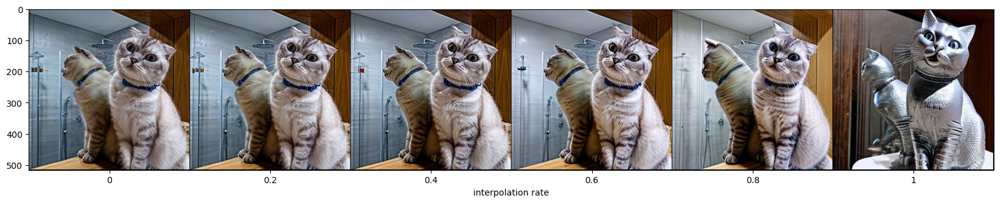

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, model)

In [ ]:
image_path = "./gnochi_mirror.jpeg"
prompt = "Picasso painting of a cat sitting next to a mirror"
model = reload_model()

emb, orig_emb, max_length, model = learn_embedding(image_path, prompt, model)

Learning an embedding...


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

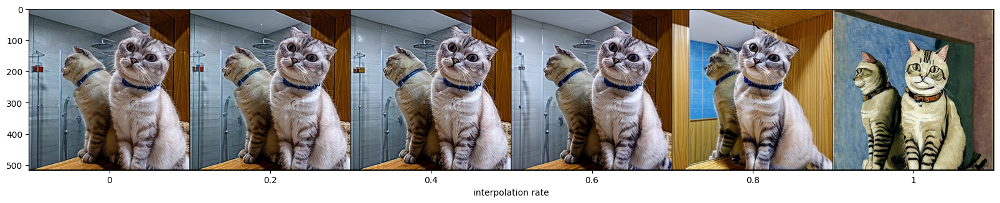

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, model)

### A picture of a man eating a doughnut in the park

In [ ]:
image_path = "./man.jpeg"
prompt = "a red-haired man in glasses eating a doughnut in the park"
model = reload_model()

emb, orig_emb, max_length, model = learn_embedding(image_path, prompt, model)

Learning an embedding...


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

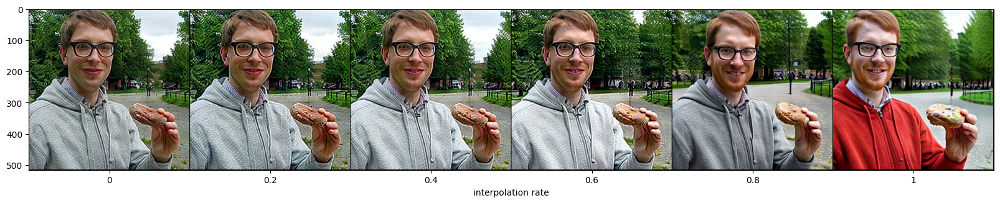

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, model)

### A picture of a baby

In [ ]:
image_path = "./baby.jpeg"
prompt = "a baby wearing a blue shirt lying in the ball pit"
model = reload_model()

emb, orig_emb, max_length, model = learn_embedding(image_path, prompt, model)

Learning an embedding...


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

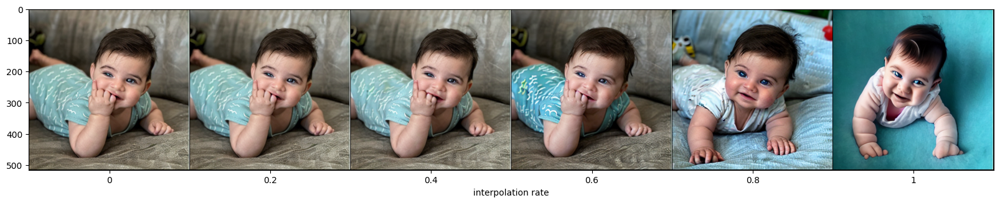

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, model)

### A full face photo

In [ ]:
image_path = "./face.jpeg"
prompt = "a photo of a woman wearing glasses"
model = reload_model()

emb, orig_emb, max_length, model = learn_embedding(image_path, prompt, model)

Learning an embedding...


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

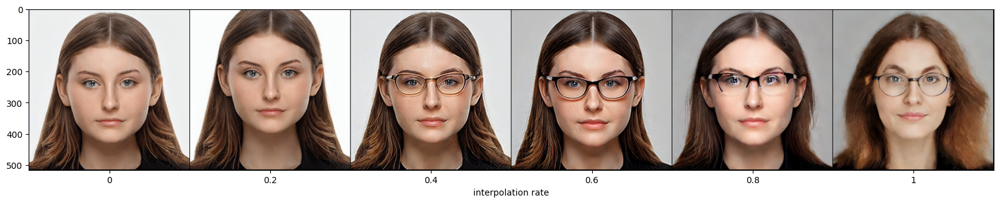

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, model)

### A picture of a landscape

In [ ]:
image_path = "./landscape.jpeg"
prompt = "a photo of a lake with boats in front of the mountains"
model = reload_model()

emb, orig_emb, max_length, model = learn_embedding(image_path, prompt, model)

Learning an embedding...


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

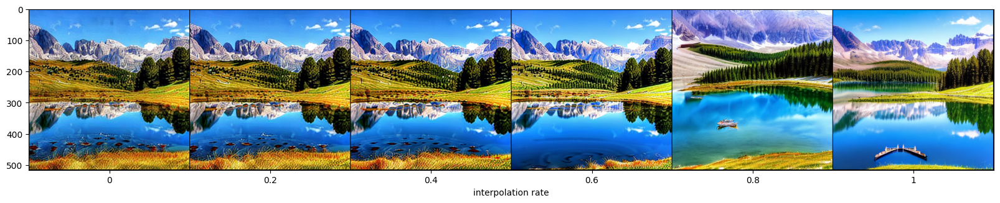

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, model)

### The Beatles

In [ ]:
image_path = "./beatles.jpeg"
prompt = "minecraft picture of the beatles crossing abbey road"
model = reload_model()

emb, orig_emb, max_length, model = learn_embedding(image_path, prompt, model)

Learning an embedding...


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

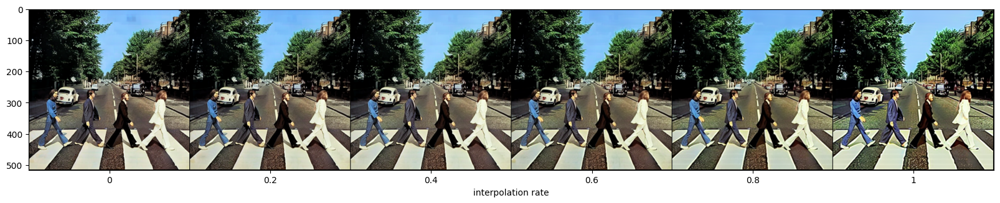

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, model)

### Mona Lisa

In [ ]:
image_path = "./mona.jpeg"
prompt = "Modigliani painting of mona lisa"
model = reload_model()

emb, orig_emb, max_length, model = learn_embedding(image_path, prompt, model)

Learning an embedding...


  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/1500 [00:00<?, ?it/s]

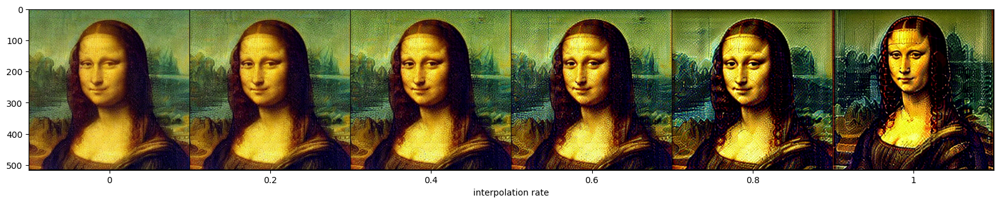

In [ ]:
_ = generate_with_interpolation(orig_emb, emb, max_length, model)